<a href="https://colab.research.google.com/github/AnushaV01/Coronary-Heart-Disease-Analysis_INSE-6220/blob/main/INSE6220_PCA_CoronaryHeartDisease_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Principal Component Analysis of Coronary Heart Disease**

In [1]:
!pip install pycaret==3.0.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 481.8/481.8 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 160.5/160.5 kB 6.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 12.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.6/172.6 kB 21.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.4/73.4 kB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.7/20.7 MB 58.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 79.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 82.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 88.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.7/138.7 kB 15.1 MB/s 

In [2]:
from pycaret.utils import version
version()

'3.0.0'

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import pandas as pd
plt.rcParams['figure.figsize'] = (7,5)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [4]:
print("Pandas version: ", pd.__version__)
print("Seaborn version: ", sns.__version__)

Pandas version:  1.5.3
Seaborn version:  0.12.2


Dataset

In [6]:
df = pd.read_csv('https://github.com/AnushaV01/Coronary-Heart-Disease-Analysis_INSE-6220/raw/main/Coronary%20Heart%20Disease%20Dataset-%20INSE%206220.csv')
df.head(25)

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
0,1,39,4.0,0,0.0,0.0,0,0,0,195.0,106.0,70.0,26.97,80.0,77.0,0
1,0,46,2.0,0,0.0,0.0,0,0,0,250.0,121.0,81.0,28.73,95.0,76.0,0
2,1,48,1.0,1,20.0,0.0,0,0,0,245.0,127.5,80.0,25.34,75.0,70.0,0
3,0,61,3.0,1,30.0,0.0,0,1,0,225.0,150.0,95.0,28.58,65.0,103.0,1
4,0,46,3.0,1,23.0,0.0,0,0,0,285.0,130.0,84.0,23.10,85.0,85.0,0
5,0,43,2.0,0,0.0,0.0,0,1,0,228.0,180.0,110.0,30.30,77.0,99.0,0
6,0,63,1.0,0,0.0,0.0,0,0,0,205.0,138.0,71.0,33.11,60.0,85.0,1
7,0,45,2.0,1,20.0,0.0,0,0,0,313.0,100.0,71.0,21.68,79.0,78.0,0
8,1,52,1.0,0,0.0,0.0,0,1,0,260.0,141.5,89.0,26.36,76.0,79.0,0
9,1,43,1.0,1,30.0,0.0,0,1,0,225.0,162.0,107.0,23.61,93.0,88.0,0


In [7]:
len(df.index)

2599

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2599 entries, 0 to 2598
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   male             2599 non-null   int64  
 1   age              2599 non-null   int64  
 2   education        2533 non-null   float64
 3   currentSmoker    2599 non-null   int64  
 4   cigsPerDay       2584 non-null   float64
 5   BPMeds           2564 non-null   float64
 6   prevalentStroke  2599 non-null   int64  
 7   prevalentHyp     2599 non-null   int64  
 8   diabetes         2599 non-null   int64  
 9   totChol          2565 non-null   float64
 10  sysBP            2599 non-null   float64
 11  diaBP            2599 non-null   float64
 12  BMI              2584 non-null   float64
 13  heartRate        2598 non-null   float64
 14  glucose          2361 non-null   float64
 15  TenYearCHD       2599 non-null   int64  
dtypes: float64(9), int64(7)
memory usage: 325.0 KB


In [9]:
print("Number of duplicated rows is: ", df.duplicated().sum())

Number of duplicated rows is:  0


Now removing the NA Valued Rows

In [10]:
df.dropna(inplace=True)
df.isnull().sum()

male               0
age                0
education          0
currentSmoker      0
cigsPerDay         0
BPMeds             0
prevalentStroke    0
prevalentHyp       0
diabetes           0
totChol            0
sysBP              0
diaBP              0
BMI                0
heartRate          0
glucose            0
TenYearCHD         0
dtype: int64

In [11]:
print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())

Number of rows with NaNs is:  0


**Explanatory Data Analysis**

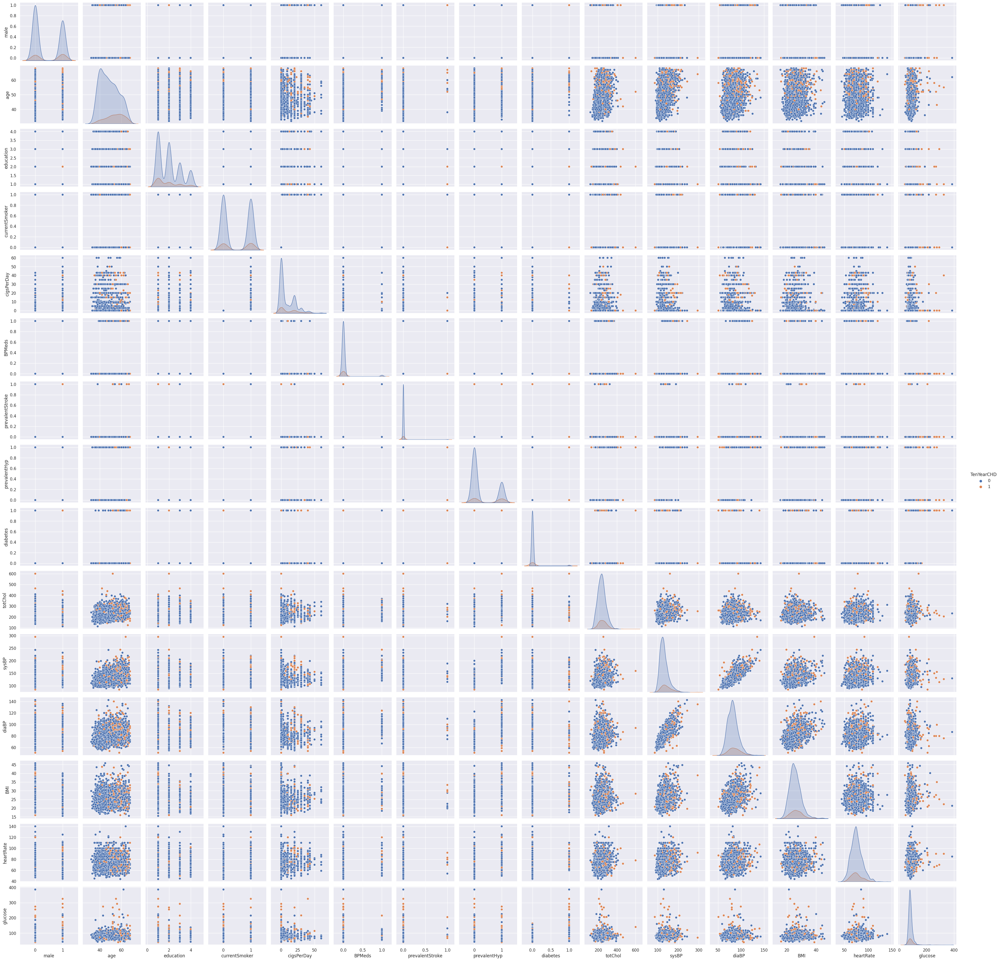

In [12]:
sns.pairplot(df, hue='TenYearCHD')
plt.show()

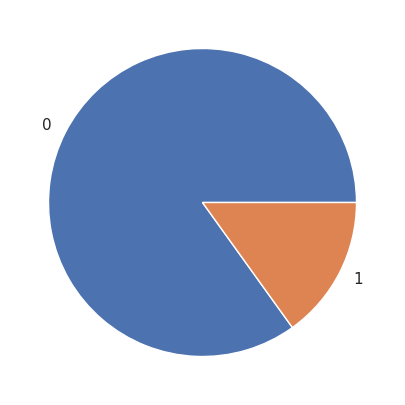

In [13]:
y =df['TenYearCHD']
y.value_counts().plot(kind='pie')
plt.ylabel('')
plt.show()

**Data Matrix**

In [14]:
X = df.drop(columns=['TenYearCHD'])
X.head(10)

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose
0,1,39,4.0,0,0.0,0.0,0,0,0,195.0,106.0,70.0,26.97,80.0,77.0
1,0,46,2.0,0,0.0,0.0,0,0,0,250.0,121.0,81.0,28.73,95.0,76.0
2,1,48,1.0,1,20.0,0.0,0,0,0,245.0,127.5,80.0,25.34,75.0,70.0
3,0,61,3.0,1,30.0,0.0,0,1,0,225.0,150.0,95.0,28.58,65.0,103.0
4,0,46,3.0,1,23.0,0.0,0,0,0,285.0,130.0,84.0,23.10,85.0,85.0
5,0,43,2.0,0,0.0,0.0,0,1,0,228.0,180.0,110.0,30.30,77.0,99.0
6,0,63,1.0,0,0.0,0.0,0,0,0,205.0,138.0,71.0,33.11,60.0,85.0
7,0,45,2.0,1,20.0,0.0,0,0,0,313.0,100.0,71.0,21.68,79.0,78.0
8,1,52,1.0,0,0.0,0.0,0,1,0,260.0,141.5,89.0,26.36,76.0,79.0
9,1,43,1.0,1,30.0,0.0,0,1,0,225.0,162.0,107.0,23.61,93.0,88.0


In [15]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
male,2235.0,0.437136,0.496143,0.00,0.00,0.00,1.00,1.0
age,2235.0,49.471141,8.619243,32.00,42.00,49.00,56.00,68.0
education,2235.0,1.991499,1.018372,1.00,1.00,2.00,3.00,4.0
currentSmoker,2235.0,0.485906,0.499913,0.00,0.00,0.00,1.00,1.0
cigsPerDay,2235.0,8.866667,11.824104,0.00,0.00,0.00,20.00,60.0
BPMeds,2235.0,0.026398,0.160352,0.00,0.00,0.00,0.00,1.0
prevalentStroke,2235.0,0.004027,0.063344,0.00,0.00,0.00,0.00,1.0
prevalentHyp,2235.0,0.302908,0.459619,0.00,0.00,0.00,1.00,1.0
diabetes,2235.0,0.021924,0.146468,0.00,0.00,0.00,0.00,1.0
totChol,2235.0,236.954810,44.515699,113.00,206.00,234.00,264.00,600.0


**Standardize the Data**

In [16]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns
X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose
0,1.134731,-1.215128,1.972709,-0.972198,-0.750048,-0.164663,-0.063586,-0.659190,-0.149718,-0.942683,-1.184163,-1.079037,0.295453,0.395427,-0.216166
1,-0.881266,-0.402810,0.008350,-0.972198,-0.750048,-0.164663,-0.063586,-0.659190,-0.149718,0.293113,-0.504460,-0.154406,0.733545,1.662677,-0.265556
2,1.134731,-0.170719,-0.973830,1.028597,0.941790,-0.164663,-0.063586,-0.659190,-0.149718,0.180767,-0.209922,-0.238463,-0.110280,-0.026989,-0.561895
3,-0.881266,1.337871,0.990529,1.028597,1.787710,-0.164663,-0.063586,1.517013,-0.149718,-0.268613,0.809632,1.022397,0.696207,-0.871822,1.067970
4,-0.881266,-0.402810,0.990529,1.028597,1.195566,-0.164663,-0.063586,-0.659190,-0.149718,1.079528,-0.096638,0.097766,-0.667852,0.817844,0.178953
5,-0.881266,-0.750946,0.008350,-0.972198,-0.750048,-0.164663,-0.063586,1.517013,-0.149718,-0.201206,2.169038,2.283258,1.124343,0.141977,0.870411
6,-0.881266,1.569962,-0.973830,-0.972198,-0.750048,-0.164663,-0.063586,-0.659190,-0.149718,-0.717993,0.265870,-0.994980,1.823797,-1.294239,0.178953
7,-0.881266,-0.518855,0.008350,1.028597,0.941790,-0.164663,-0.063586,-0.659190,-0.149718,1.708660,-1.456044,-0.994980,-1.021313,0.310944,-0.166776
8,1.134731,0.293463,-0.973830,-0.972198,-0.750048,-0.164663,-0.063586,1.517013,-0.149718,0.517803,0.424467,0.518053,0.143614,0.057494,-0.117387
9,1.134731,-0.750946,-0.973830,1.028597,1.787710,-0.164663,-0.063586,1.517013,-0.149718,-0.268613,1.353394,2.031086,-0.540905,1.493710,0.327122


In [17]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
male,2235.0,3.179162e-17,1.000224,-0.881266,-0.881266,-0.881266,1.134731,1.134731
age,2235.0,3.910369e-16,1.000224,-2.027446,-0.866992,-0.054674,0.757644,2.150189
education,2235.0,-4.450827e-17,1.000224,-0.973830,-0.973830,0.008350,0.990529,1.972709
currentSmoker,2235.0,8.583738e-17,1.000224,-0.972198,-0.972198,-0.972198,1.028597,1.028597
cigsPerDay,2235.0,-7.153115e-18,1.000224,-0.750048,-0.750048,-0.750048,0.941790,4.325467
BPMeds,2235.0,2.384372e-18,1.000224,-0.164663,-0.164663,-0.164663,-0.164663,6.073002
prevalentStroke,2235.0,-1.112707e-17,1.000224,-0.063586,-0.063586,-0.063586,-0.063586,15.726835
prevalentHyp,2235.0,5.086659e-17,1.000224,-0.659190,-0.659190,-0.659190,1.517013,1.517013
diabetes,2235.0,-5.166138e-18,1.000224,-0.149718,-0.149718,-0.149718,-0.149718,6.679240
totChol,2235.0,-1.581633e-16,1.000224,-2.785142,-0.695524,-0.066392,0.607679,8.157267


**Observations and variables**

In [18]:
observations = list(df.index)
variables = list(df.columns)

**Box and Whisker Plots**

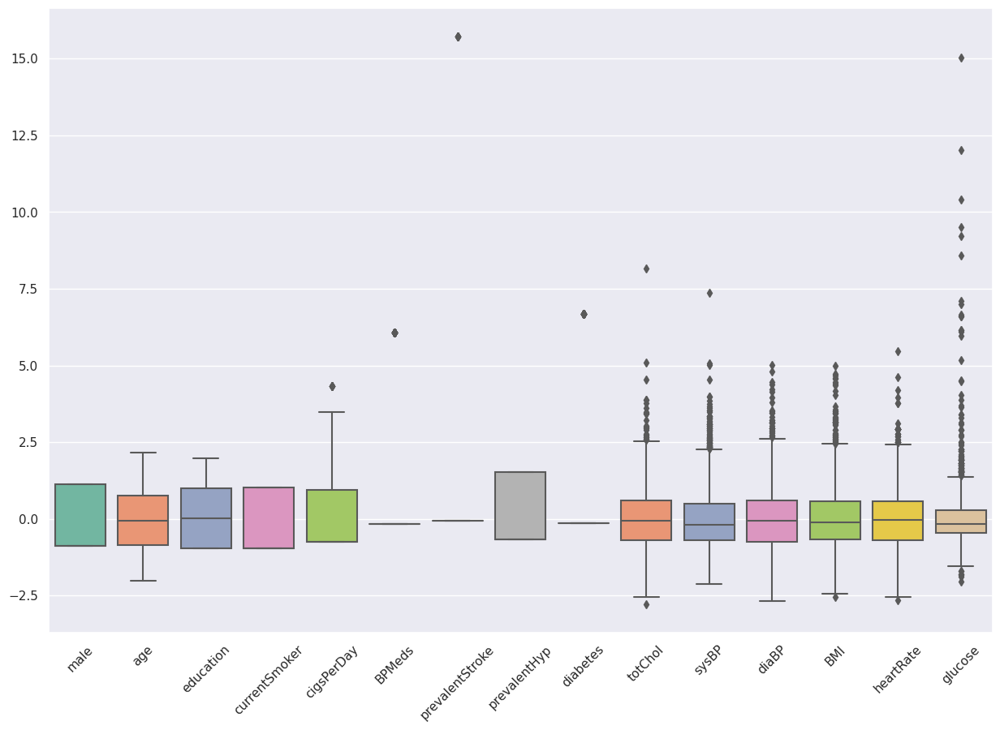

In [19]:
ax = plt.figure(figsize=(15,10))
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

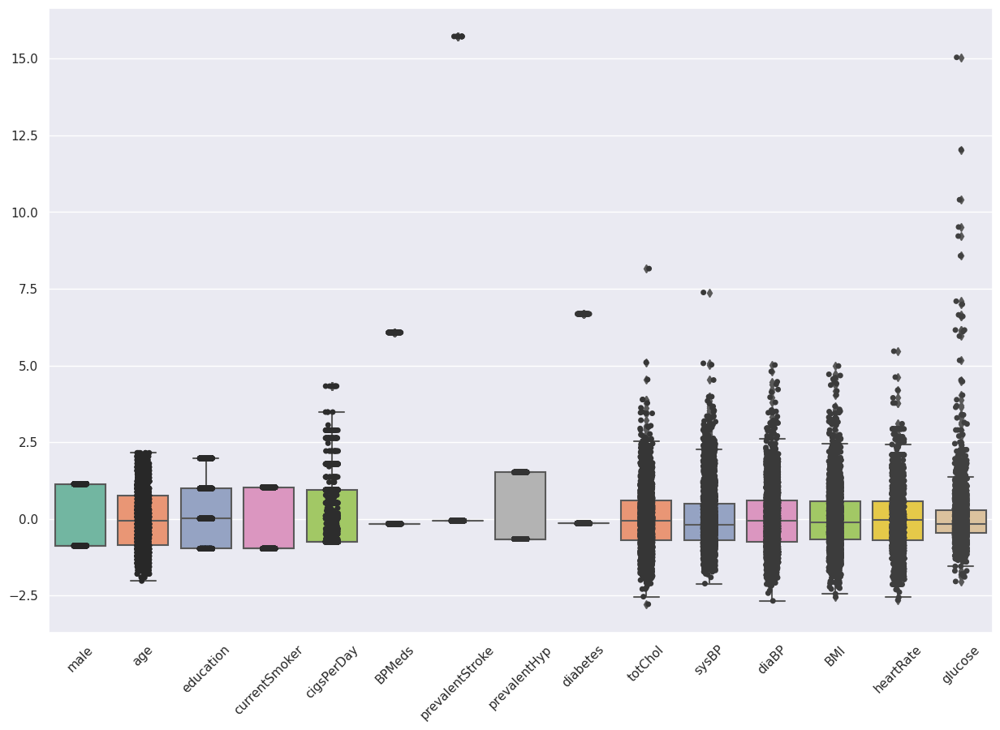

In [20]:
ax = plt.figure(figsize=(15,10))
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax = sns.stripplot(data=X, color=".25")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

**Correlation Matrix**

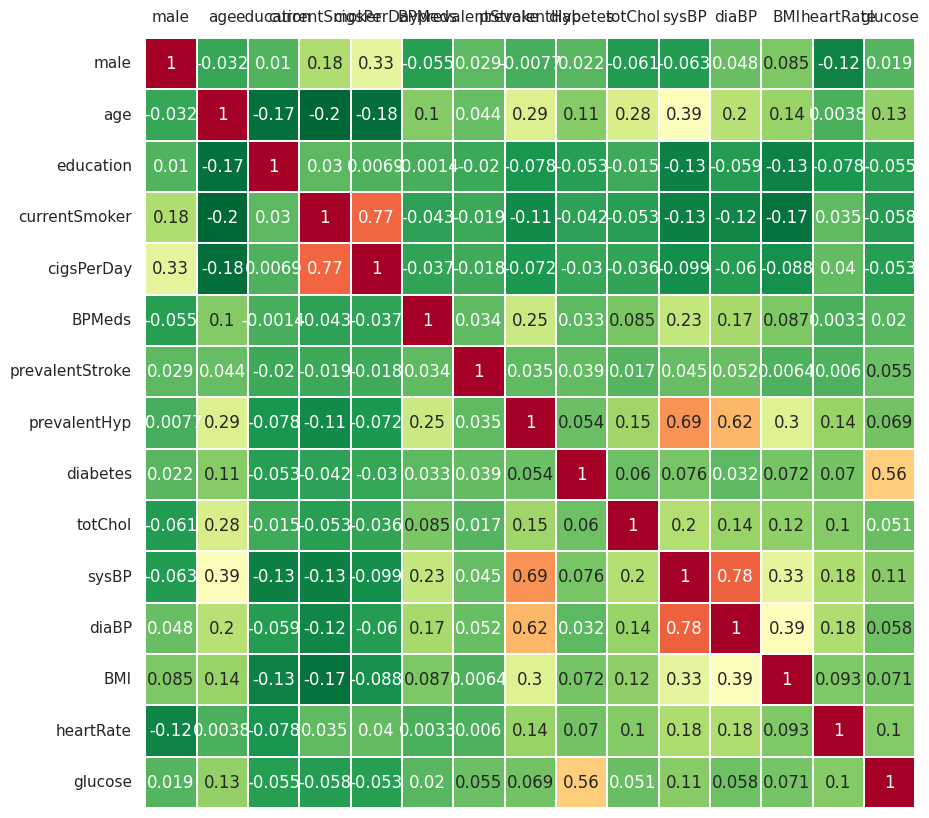

In [21]:
fig1,ax1 = plt.subplots(figsize=(15,10))
ax = sns.heatmap(X.corr(), cmap='RdYlGn_r', linewidths=0.3, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=0);

### **Principal Component Analysis (PCA)**

Text(0, 0.5, '$Z_2$')

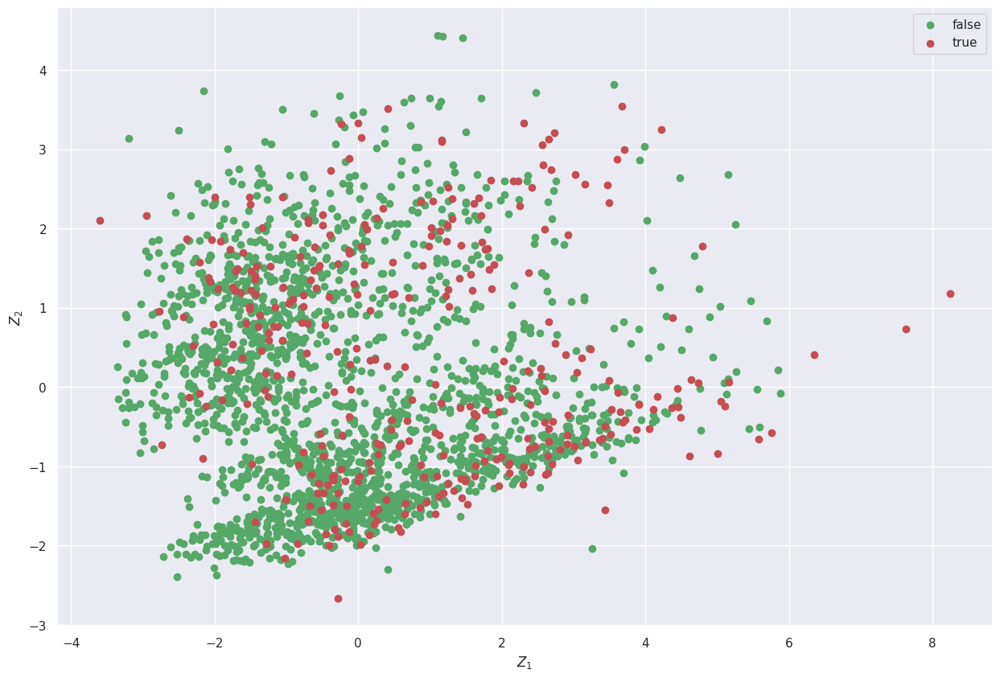

In [22]:
pca = PCA()
Z = pca.fit_transform(X)

# (true)->1,  (false)->0

idx_false= np.where(y == 0)
idx_true = np.where(y == 1)


plt. figure(figsize=(15,10))
plt.scatter(Z[idx_false,0], Z[idx_false,1], c='g', label='false')
plt.scatter(Z[idx_true,0], Z[idx_true,1], c='r', label='true')


plt.legend()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')

**Eigenvectors**

array([[-5.80087335e-02,  3.57847144e-01,  7.84983461e-02,
        -5.86264837e-01,  9.34744809e-02, -1.18487278e-01,
        -1.08260846e-01, -1.95332856e-01,  1.52206099e-01,
        -5.98364095e-01,  1.94561499e-01, -1.36063294e-02,
        -1.20875767e-02, -1.42349360e-01,  8.00303976e-02],
       [ 2.96123996e-01, -8.54327584e-02,  7.72897275e-02,
        -2.49156617e-02,  5.70541718e-01,  1.69921748e-02,
        -9.42623981e-02,  9.27467149e-03, -2.98029267e-01,
        -2.47300154e-01, -6.18801251e-01, -3.04947096e-02,
         7.14287002e-02,  1.31273638e-02, -1.56656350e-01],
       [-1.14207122e-01, -2.37138423e-02, -9.84459224e-02,
        -5.89298139e-02, -3.68031952e-01,  6.35331776e-01,
        -2.23140896e-01, -5.28081881e-01, -8.40810235e-02,
        -4.72261475e-02, -3.06885806e-01, -1.16618076e-02,
         3.80117676e-03,  1.22766841e-02,  4.11553073e-02],
       [-2.05830207e-01,  5.88142459e-01,  5.38816349e-02,
         1.94080114e-01,  8.28678283e-02,  8.43551323

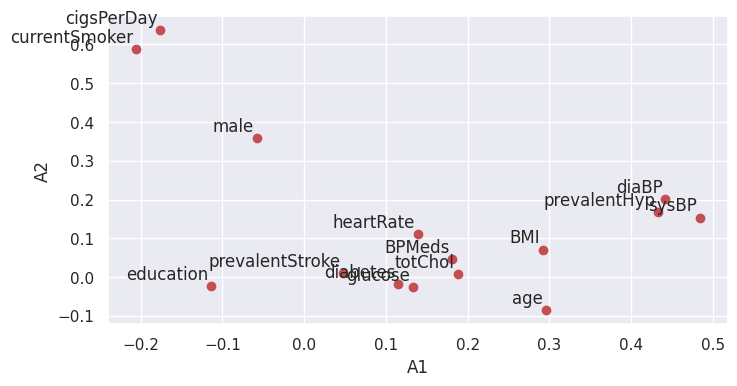

In [23]:
A = pca.components_.T
plt. figure(figsize=(8,4))

plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('A1')
plt.ylabel('A2')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')
A


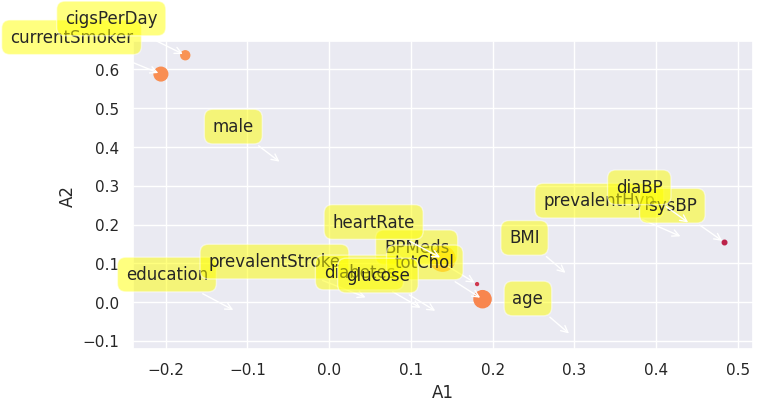

In [24]:
plt. figure(figsize=(8,4))
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('A1')
plt.ylabel('A2')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

**Scree Plot and Eigenvalues**

array([3.17076761, 1.85517734, 1.55952163, 1.11543684, 1.06698   ,
       1.05012927, 0.98832679, 0.92945173, 0.81626754, 0.67511674,
       0.57957577, 0.43368378, 0.38055247, 0.21173955, 0.17398736])

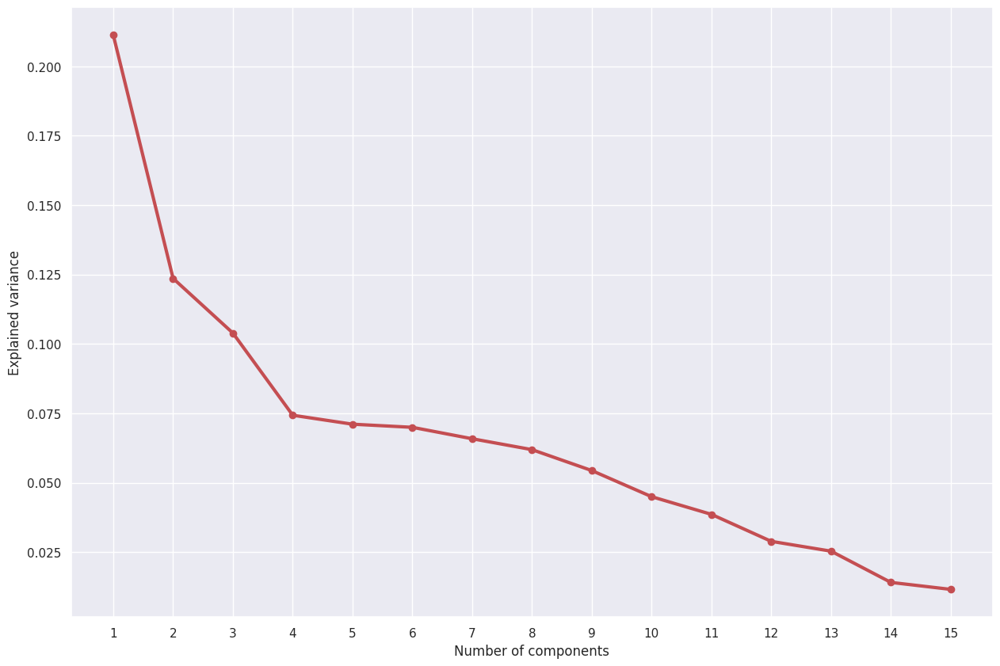

In [25]:
#Eigenvalues
Lambda = pca.explained_variance_

#Scree plot
x = np.arange(len(Lambda)) + 1
plt. figure(figsize=(15,10))
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
Lambda

**Explained Variance**

Text(0, 0.5, 'Cumulative explained variance')

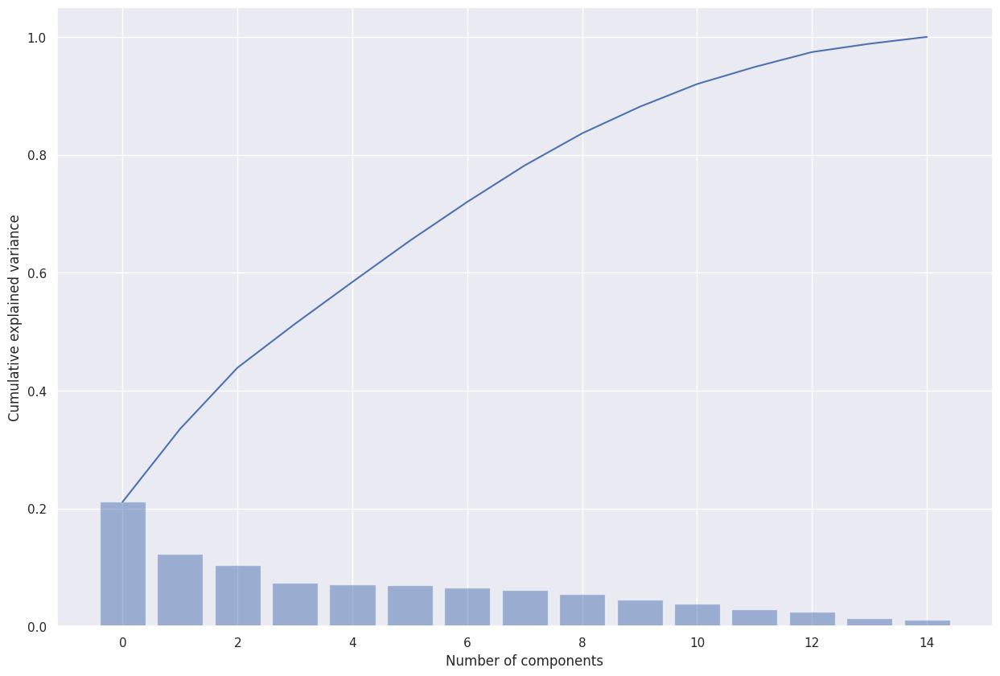

In [26]:
ell = pca.explained_variance_ratio_
ind = np.arange(len(ell))
plt. figure(figsize=(15,10))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

**Biplot**

array([-1.03728305, -1.30759228,  1.45790869, ...,  0.3731259 ,
        2.10375043, -0.23909767])

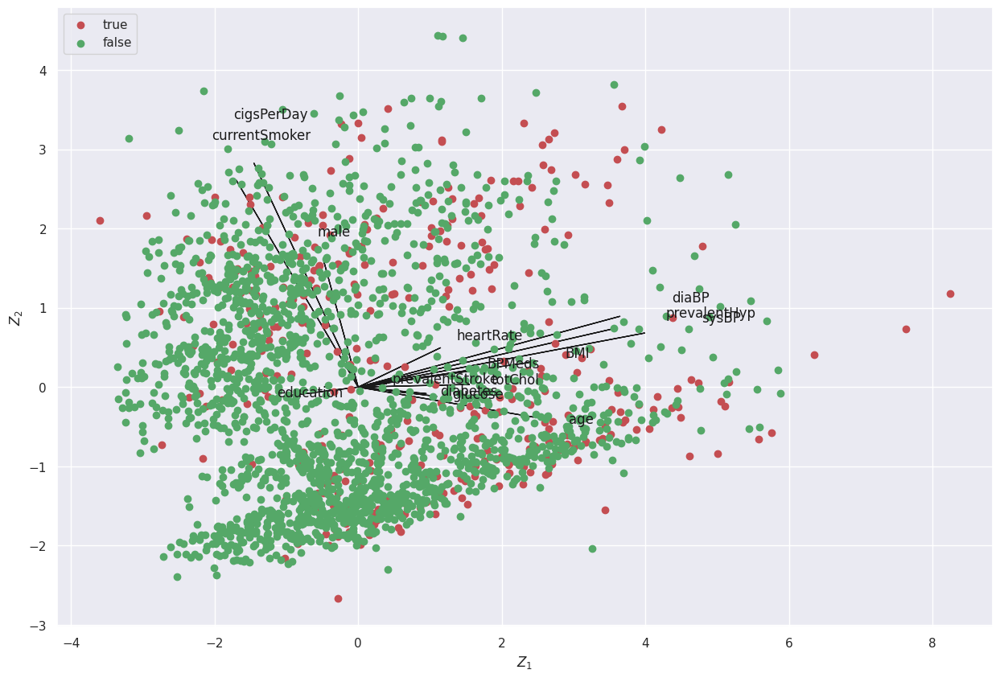

In [27]:
# 0,1 denote PC1 and PC2; change values for other PCs
A1 = A[:,0]
A2 = A[:,1]
Z1 = Z[:,0]
Z2 = Z[:,1]

plt. figure(figsize=(15,10))
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')
for i in range(len(A1)):
# arrows project features as vectors onto PC axes
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k')

plt.scatter(Z[idx_true,0], Z[idx_true,1], c='r', label='true')
plt.scatter(Z[idx_false,0], Z[idx_false,1], c='g', label='false')

plt.legend(loc='upper left')
Z1
Z2

# Using PCA Library

In [30]:
!pip install pca

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.3/51.3 kB 3.6 MB/s eta 0:00:00


In [31]:
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [15] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [13] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [15] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[13]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


**Principal Components**

In [32]:
out['PC']

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13
0,-1.768774,-1.037283,-0.169544,-1.005458,-1.700490,0.422723,-0.257021,-1.168744,0.969167,-1.129434,-0.384775,-0.139037,-0.435923
1,0.079832,-1.307592,-0.158811,1.297796,-0.672756,-0.764371,0.316013,-0.658829,1.191215,-0.263695,-0.312673,-0.100996,0.182413
2,-1.001729,1.457909,-0.029931,-0.191923,0.881913,-0.779565,0.064678,0.225013,0.348538,-0.273249,0.342203,-0.208939,0.371668
3,1.431817,1.789481,0.160879,-0.160919,-0.007401,0.900026,-0.554368,-0.052057,-1.437601,1.437493,-1.447848,0.790285,-0.516780
4,-0.797411,0.998624,0.180854,1.803687,0.009671,0.919994,-0.127885,-0.887049,-0.051926,0.438837,0.041921,0.318417,0.518467
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2230,-1.392669,-1.633333,-0.477808,0.990793,-0.570075,-0.131258,0.331849,-0.199047,0.739940,-0.037291,0.907160,-0.434463,-0.168648
2231,-1.983318,-1.424729,-0.084153,-2.186496,-0.270294,1.355676,-0.864389,-0.840906,0.001271,-0.269861,0.115821,0.172535,-0.321105
2232,-2.576991,0.373126,0.906473,1.187115,-1.115982,0.826561,0.163011,0.059189,-0.026615,0.469550,-0.056564,0.844967,-0.585638
2233,1.538157,2.103750,-0.165198,-0.458872,0.889199,-0.430959,0.065067,0.715970,-1.884146,-0.921869,-0.078483,-0.015910,-0.131628


**Scatter Plot**

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.


(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '13 Principal Components explain [98.84%] of the variance'}, xlabel='PC1 (21.1% expl.var)', ylabel='PC2 (12.3% expl.var)'>)

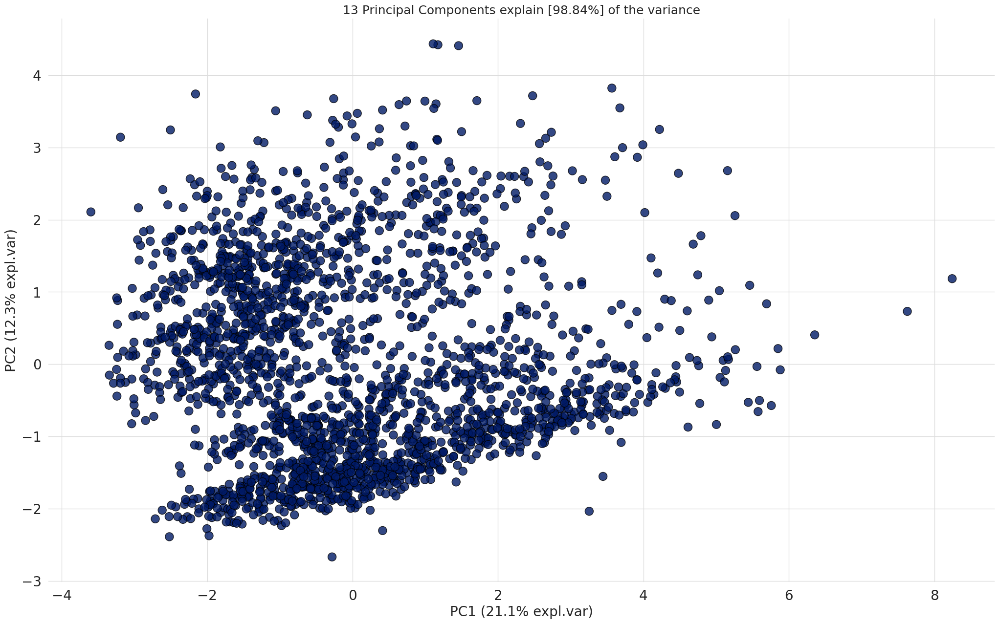

In [33]:
model.scatter(label=True, legend=False)

**Eigenvectors**

In [34]:
A = out['loadings'].T
A

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13
male,-0.058009,0.357847,0.078498,-0.586265,0.093474,-0.118487,-0.108261,-0.195333,0.152206,-0.598364,0.194561,-0.013606,-0.012088
age,0.296124,-0.085433,0.077290,-0.024916,0.570542,0.016992,-0.094262,0.009275,-0.298029,-0.247300,-0.618801,-0.030495,0.071429
education,-0.114207,-0.023714,-0.098446,-0.058930,-0.368032,0.635332,-0.223141,-0.528082,-0.084081,-0.047226,-0.306886,-0.011662,0.003801
currentSmoker,-0.205830,0.588142,0.053882,0.194080,0.082868,0.084355,0.011255,0.086493,-0.100303,0.233709,-0.149167,0.025370,-0.000373
cigsPerDay,-0.176006,0.636657,0.059457,0.082780,0.093398,0.027873,-0.015644,0.036491,-0.019579,0.117453,-0.104868,0.000126,0.015981
BPMeds,0.181035,0.046518,-0.078894,0.008629,0.009082,0.554915,0.005464,0.590357,0.497865,-0.203225,-0.039297,0.036758,0.094695
prevalentStroke,0.047927,0.009641,0.088046,-0.192751,0.134059,0.217207,0.910466,-0.217578,0.041650,0.087321,-0.031089,-0.019724,-0.019678
prevalentHyp,0.433052,0.166787,-0.130839,-0.032587,-0.104620,0.091781,-0.014730,0.066441,-0.206867,0.004612,0.119990,-0.111337,-0.810662
diabetes,0.114878,-0.018477,0.671038,-0.043010,-0.115835,0.086721,-0.091885,0.051879,-0.006232,0.105745,0.059492,-0.692508,0.088367
totChol,0.187699,0.007545,0.045289,0.303602,0.553189,0.202771,-0.198996,-0.442575,0.314438,0.138221,0.409997,0.032897,-0.022484


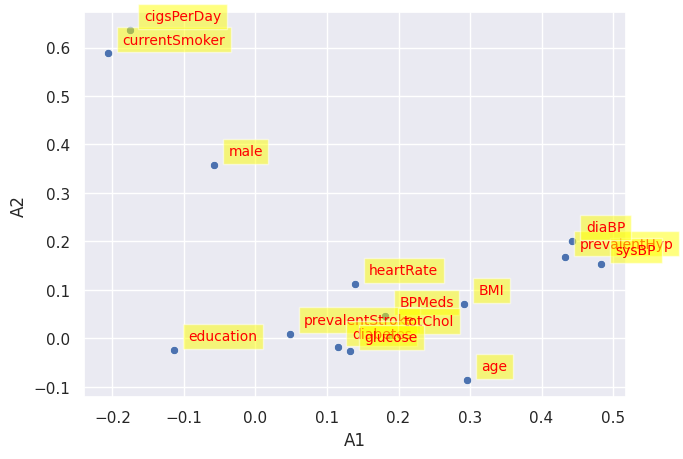

In [35]:
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('A1')
plt.ylabel('A2')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))

**Scree Plot**

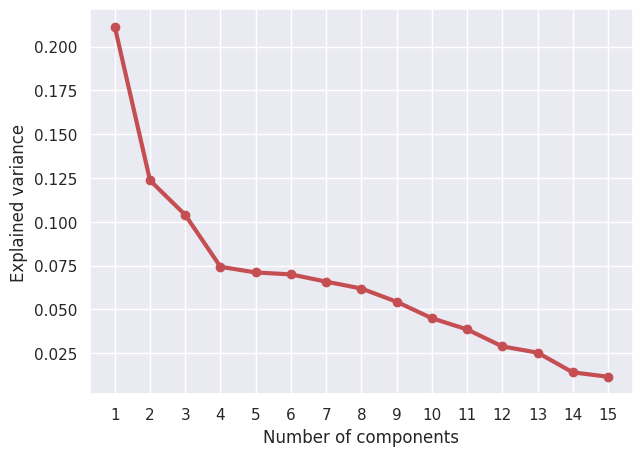

In [36]:
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
plt.show()

**Explained Variance Plot**

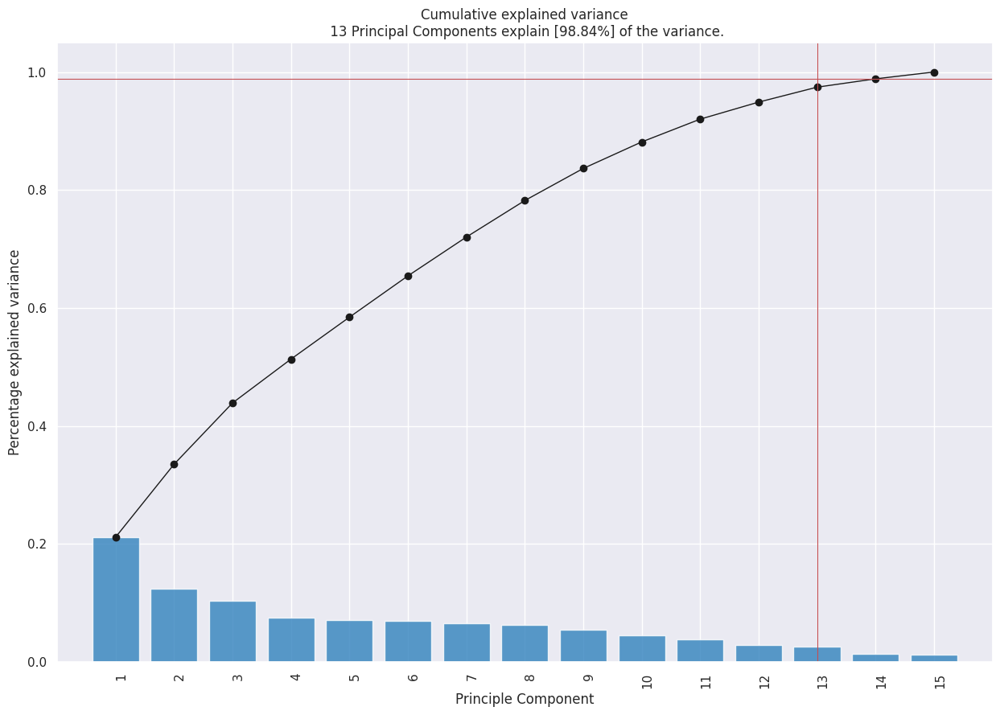

In [37]:
model.plot();

**Biplot**

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[pca] >Plot PC1 vs PC2 with loadings.


(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '13 Principal Components explain [98.84%] of the variance'}, xlabel='PC1 (21.1% expl.var)', ylabel='PC2 (12.3% expl.var)'>)

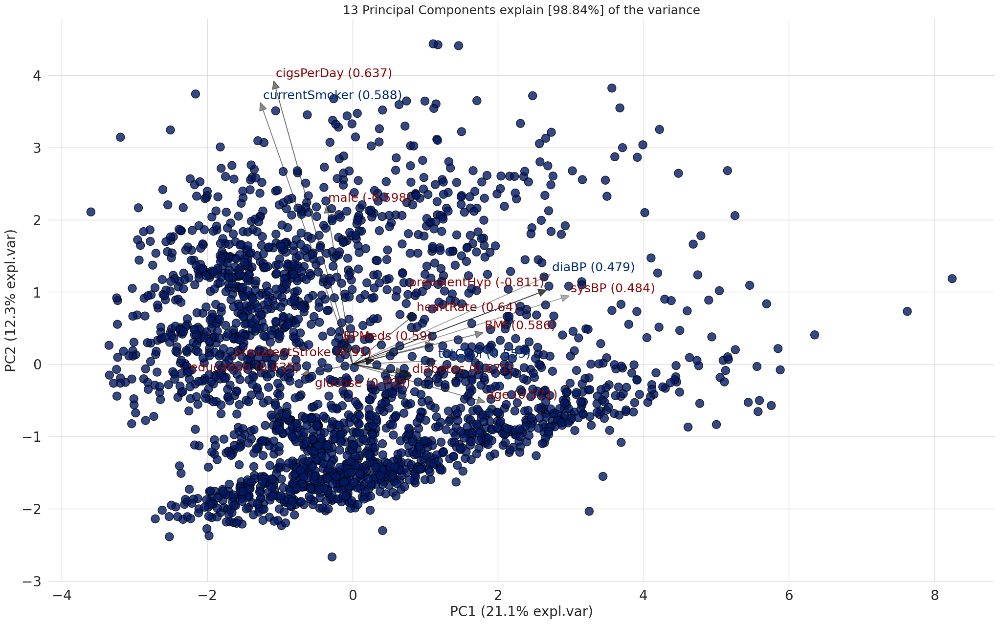

In [38]:
model.biplot(label=False, legend=False, color_arrow='k')

[scatterd] >INFO> Create scatterplot


[pca] >Plot PC1 vs PC2 vs PC3 with loadings.


(<Figure size 3000x2500 with 1 Axes>,
 <Axes3D: title={'center': '13 Principal Components explain [98.84%] of the variance'}, xlabel='PC1 (21.1% expl.var)', ylabel='PC2 (12.3% expl.var)', zlabel='PC3 (10.3% expl.var)'>)

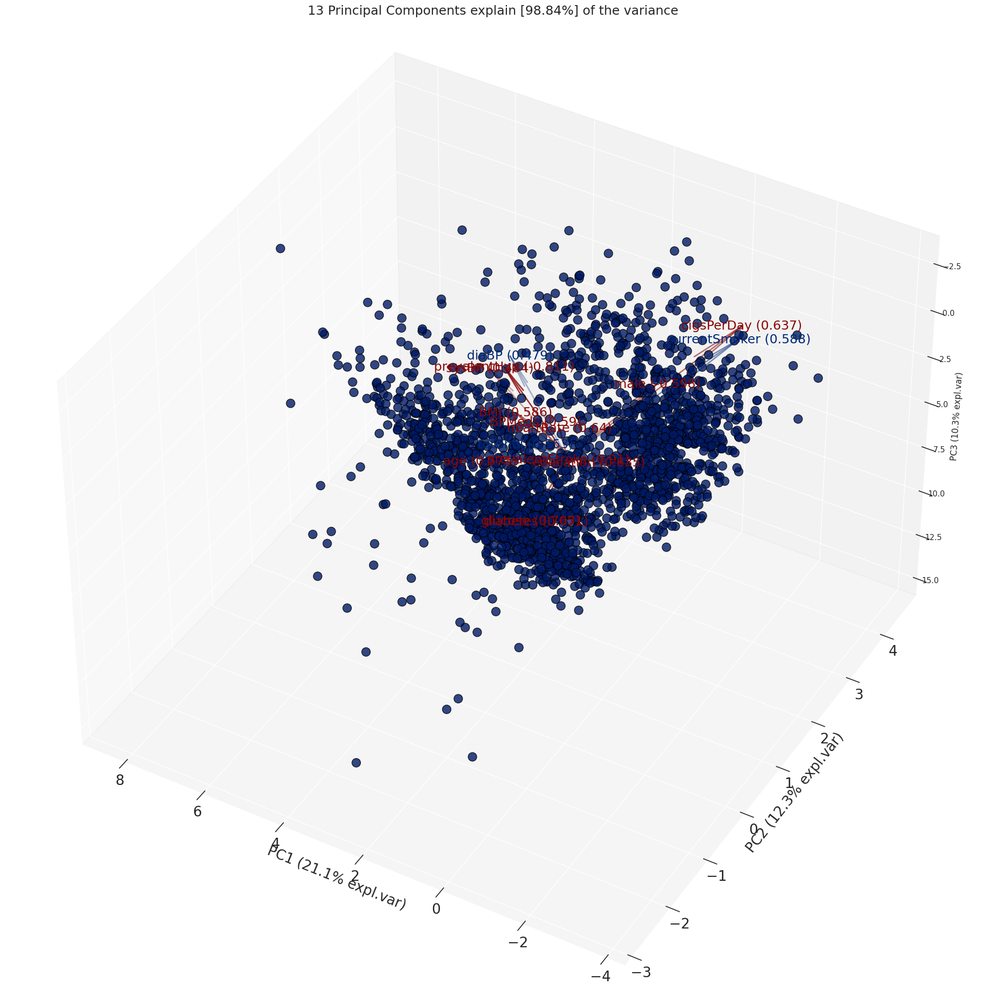

In [39]:
model.biplot3d(legend=False)

# Classification using Pycaret

At first dataset is split into train and test set with 70% and 30% ratio respectively. Then using the PyCaret compare_models() function, the models which shows the highest accuracy on the original dataset can be found. Before applying PCA, the output from compare_models() function shows that Linear Discriminant Analayis, Extra Trees Classifier, and Gradient Boosting Classifier shows the best performance.

However, after applying PCA, the these models performance decreases and Logistic Regression, K-nearest neighbour, and Quadratic Discriminant Analysis shows the highest performance. Therefore, I have taken Logistic Regression, K-nearest Neighbour and Quadratic discriminant Analysis as my classification algorithms and applied these three models on the original dataset before applying PCA and after applying PCA

In [40]:
from pycaret.utils import version
version()

'3.0.0'

In [41]:
data = df.sample(frac=0.9, random_state=786)
data_unseen = df.drop(data.index)
#dr = df.drop(columns=['id'])

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (2012, 16)
Unseen Data For Predictions: (223, 16)


In [42]:
from pycaret.classification import *
clf = setup(data=data, target='TenYearCHD', train_size=0.7, session_id=123)

,Description,Value
0,Session id,123
1,Target,TenYearCHD
2,Target type,Binary
3,Original data shape,"(2012, 16)"
4,Transformed data shape,"(2012, 16)"
5,Transformed train set shape,"(1408, 16)"
6,Transformed test set shape,"(604, 16)"
7,Numeric features,15
8,Preprocess,True
9,Imputation type,simple


**Comparing All Models**

In [43]:
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.8516,0.7119,0.0703,0.5517,0.1226,0.0930,0.1559,1.1450
dummy,Dummy Classifier,0.8494,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.1270
lda,Linear Discriminant Analysis,0.8487,0.7126,0.0985,0.4845,0.1605,0.1174,0.1637,0.0990
ridge,Ridge Classifier,0.8480,0.0000,0.0188,0.2000,0.0344,0.0219,0.0397,0.0850
et,Extra Trees Classifier,0.8480,0.6479,0.0468,0.4550,0.0808,0.0564,0.1044,0.5150
svm,SVM - Linear Kernel,0.8459,0.0000,0.0424,0.2950,0.0692,0.0462,0.0778,0.0580
rf,Random Forest Classifier,0.8452,0.6725,0.0377,0.2917,0.0664,0.0402,0.0649,0.7260
ada,Ada Boost Classifier,0.8430,0.6344,0.1266,0.4472,0.1928,0.1348,0.1701,0.3070
knn,K Neighbors Classifier,0.8381,0.5958,0.0658,0.3600,0.1058,0.0591,0.0872,0.0860
qda,Quadratic Discriminant Analysis,0.8381,0.6835,0.1554,0.4160,0.2236,0.1532,0.1780,0.0640


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [44]:
best_model

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

**Logistic Regresssion**

In [45]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8440,0.7480,0.0476,0.3333,0.0833,0.0479,0.0764
1,0.8582,0.7393,0.0476,1.0000,0.0909,0.0784,0.2020
2,0.8440,0.7333,0.0476,0.3333,0.0833,0.0479,0.0764
3,0.8511,0.7992,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.8582,0.7206,0.0952,0.6667,0.1667,0.1344,0.2144
5,0.8582,0.7504,0.0952,0.6667,0.1667,0.1344,0.2144
6,0.8582,0.7758,0.0909,1.0000,0.1667,0.1444,0.2790
7,0.8511,0.6509,0.1364,0.6000,0.2222,0.1745,0.2346
8,0.8357,0.6635,0.0476,0.2500,0.0800,0.0336,0.0480


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

Tune the model

Classification + PCA

In [46]:
tuned_lr=tune_model(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8582,0.7345,0.0952,0.6667,0.1667,0.1344,0.2144
1,0.8582,0.7377,0.0476,1.0000,0.0909,0.0784,0.2020
2,0.8440,0.7325,0.0476,0.3333,0.0833,0.0479,0.0764
3,0.8511,0.7996,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.8652,0.7187,0.0952,1.0000,0.1739,0.1519,0.2867
5,0.8582,0.7405,0.0952,0.6667,0.1667,0.1344,0.2144
6,0.8582,0.7739,0.0909,1.0000,0.1667,0.1444,0.2790
7,0.8511,0.6490,0.1364,0.6000,0.2222,0.1745,0.2346
8,0.8429,0.6643,0.0476,0.3333,0.0833,0.0476,0.0760


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [47]:
tuned_lr

LogisticRegression(C=6.718000000000001, class_weight={}, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [48]:
pip install pycaret --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 484.7/484.7 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 24.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 12.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.4/34.4 MB 15.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 59.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.0/119.0 kB 12.9 MB/s eta 0:00:00
  Attempting uninstall: scipy
    Found existing installation: scipy 1.11.4
    Uninstalling scipy-1.11.4:
      Successfully uninstalled scipy-1.11.4
  Attempting uninstall: scikit-base
    Found existing installation: scikit-base 0.6.1
    Uninstalling scikit-base-0.6.1:
      Successfully uninstalled scikit-base-0.6.1
  Attempting uninstall: schemdraw
    Found existing installation: schemdraw 0.17
    Uninstalling schemdraw-0.17:
      Successfully uninstalled schemdraw-0.17
  Attempting uninstall: m

**Evaluate Logistic Regression**

In [49]:
evaluate_model(tuned_lr)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

**Create model with K-nearest neighbour**

In [50]:
knn = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8227,0.5758,0.0000,0.0000,0.0000,-0.0500,-0.0715
1,0.8511,0.5835,0.0476,0.5000,0.0870,0.0627,0.1183
2,0.8298,0.5534,0.0476,0.2000,0.0769,0.0208,0.0275
3,0.8298,0.6748,0.0952,0.2857,0.1429,0.0739,0.0878
4,0.8440,0.5865,0.1429,0.4286,0.2143,0.1511,0.1795
5,0.8582,0.5345,0.0476,1.0000,0.0909,0.0784,0.2020
6,0.8227,0.6499,0.0909,0.2857,0.1379,0.0677,0.0817
7,0.8369,0.6430,0.0909,0.4000,0.1481,0.0959,0.1289
8,0.8500,0.5912,0.0952,0.5000,0.1600,0.1176,0.1681


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

Tune model with K-nearest neighbour

In [51]:
tuned_knn = tune_model(knn)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8511,0.5944,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.8582,0.6742,0.0476,1.0000,0.0909,0.0784,0.2020
2,0.8582,0.6817,0.0476,1.0000,0.0909,0.0784,0.2020
3,0.8511,0.6556,0.0476,0.5000,0.0870,0.0627,0.1183
4,0.8440,0.6206,0.0476,0.3333,0.0833,0.0479,0.0764
5,0.8511,0.5996,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.8582,0.6650,0.0909,1.0000,0.1667,0.1444,0.2790
7,0.8511,0.6337,0.0909,0.6667,0.1600,0.1273,0.2075
8,0.8500,0.5878,0.0000,0.0000,0.0000,0.0000,0.0000


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [52]:
tuned_knn

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='euclidean',
                     metric_params=None, n_jobs=-1, n_neighbors=12, p=2,
                     weights='distance')

Evaluate model with K-nearest neighbour

In [53]:
evaluate_model(tuned_knn)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

**Create model with Quadratic Discriminant Analysis**

In [54]:
qda=create_model('qda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8227,0.7179,0.0952,0.2500,0.1379,0.0608,0.0696
1,0.8582,0.7196,0.1429,0.6000,0.2308,0.1840,0.2429
2,0.8582,0.7325,0.2381,0.5556,0.3333,0.2679,0.2982
3,0.8298,0.7230,0.1429,0.3333,0.2000,0.1215,0.1352
4,0.8440,0.6345,0.0952,0.4000,0.1538,0.1024,0.1352
5,0.8582,0.7397,0.1905,0.5714,0.2857,0.2282,0.2712
6,0.8369,0.7273,0.2273,0.4545,0.3030,0.2221,0.2393
7,0.8085,0.6455,0.1364,0.2727,0.1818,0.0868,0.0935
8,0.8500,0.6427,0.1905,0.5000,0.2759,0.2105,0.2413


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

Tune QDA Model

In [55]:
tuned_qda=tune_model(qda)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8369,0.7377,0.2381,0.4167,0.3030,0.2184,0.2294
1,0.8511,0.7246,0.2857,0.5000,0.3636,0.2863,0.3007
2,0.8511,0.7528,0.2857,0.5000,0.3636,0.2863,0.3007
3,0.8156,0.7544,0.1905,0.3077,0.2353,0.1370,0.1421
4,0.8085,0.6655,0.1905,0.2857,0.2286,0.1242,0.1276
5,0.8440,0.7607,0.2381,0.4545,0.3125,0.2341,0.2497
6,0.8369,0.7540,0.3182,0.4667,0.3784,0.2883,0.2954
7,0.7943,0.7158,0.2273,0.2941,0.2564,0.1393,0.1409
8,0.7857,0.6331,0.1905,0.2353,0.2105,0.0881,0.0888


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [56]:
tuned_qda

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)

Evaluate QDA Model

In [57]:
evaluate_model(tuned_qda)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

# Classification using Pycaret

In [58]:
!pip install statsmodels --upgrade

In [59]:
clf_pca = setup(data=data, target='TenYearCHD', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 3)

,Description,Value
0,Session id,123
1,Target,TenYearCHD
2,Target type,Binary
3,Original data shape,"(2012, 16)"
4,Transformed data shape,"(2012, 4)"
5,Transformed train set shape,"(1408, 4)"
6,Transformed test set shape,"(604, 4)"
7,Numeric features,15
8,Preprocess,True
9,Imputation type,simple


Comparing Models

In [60]:
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.8523,0.6802,0.0474,0.6167,0.0870,0.0679,0.1408,0.5220
ridge,Ridge Classifier,0.8501,0.0000,0.0284,0.5333,0.0534,0.0394,0.0973,0.1340
lda,Linear Discriminant Analysis,0.8494,0.6803,0.0615,0.4700,0.1081,0.0786,0.1307,0.1020
dummy,Dummy Classifier,0.8494,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.1020
et,Extra Trees Classifier,0.8430,0.6169,0.0751,0.3767,0.1241,0.0799,0.1113,0.6930
rf,Random Forest Classifier,0.8423,0.6133,0.0563,0.4017,0.0962,0.0580,0.0955,0.7330
ada,Ada Boost Classifier,0.8409,0.6249,0.0565,0.3983,0.0968,0.0560,0.0939,0.4790
qda,Quadratic Discriminant Analysis,0.8402,0.6734,0.0803,0.3760,0.1307,0.0812,0.1120,0.1570
nb,Naive Bayes,0.8395,0.6732,0.0898,0.3850,0.1440,0.0905,0.1217,0.1680
gbc,Gradient Boosting Classifier,0.8381,0.6450,0.0563,0.2370,0.0891,0.0462,0.0563,0.4080


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

### Best model with PCA

In [61]:
best_model_pca

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

Tune Best Model

In [62]:
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8511,0.6294,0.0476,0.5000,0.0870,0.0627,0.1183
1,0.8582,0.6988,0.0476,1.0000,0.0909,0.0784,0.2020
2,0.8582,0.6770,0.0476,1.0000,0.0909,0.0784,0.2020
3,0.8511,0.7591,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.8652,0.6885,0.0952,1.0000,0.1739,0.1519,0.2867
5,0.8652,0.7722,0.0952,1.0000,0.1739,0.1519,0.2867
6,0.8511,0.7681,0.0455,1.0000,0.0870,0.0744,0.1966
7,0.8369,0.7261,0.0000,0.0000,0.0000,-0.0138,-0.0363
8,0.8429,0.5826,0.0476,0.3333,0.0833,0.0476,0.0760


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Evaluate Best Model

In [63]:
evaluate_model(tuned_best_model_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [64]:
lr_pca = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8511,0.6278,0.0476,0.5000,0.0870,0.0627,0.1183
1,0.8582,0.6988,0.0476,1.0000,0.0909,0.0784,0.2020
2,0.8582,0.6794,0.0476,1.0000,0.0909,0.0784,0.2020
3,0.8511,0.7575,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.8652,0.6901,0.0952,1.0000,0.1739,0.1519,0.2867
5,0.8652,0.7706,0.0952,1.0000,0.1739,0.1519,0.2867
6,0.8511,0.7674,0.0455,1.0000,0.0870,0.0744,0.1966
7,0.8369,0.7250,0.0000,0.0000,0.0000,-0.0138,-0.0363
8,0.8429,0.5814,0.0476,0.3333,0.0833,0.0476,0.0760


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [65]:
tuned_lr_pca = tune_model(lr_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8511,0.6294,0.0476,0.5000,0.0870,0.0627,0.1183
1,0.8582,0.6988,0.0476,1.0000,0.0909,0.0784,0.2020
2,0.8582,0.6770,0.0476,1.0000,0.0909,0.0784,0.2020
3,0.8511,0.7591,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.8652,0.6885,0.0952,1.0000,0.1739,0.1519,0.2867
5,0.8652,0.7722,0.0952,1.0000,0.1739,0.1519,0.2867
6,0.8511,0.7681,0.0455,1.0000,0.0870,0.0744,0.1966
7,0.8369,0.7261,0.0000,0.0000,0.0000,-0.0138,-0.0363
8,0.8429,0.5826,0.0476,0.3333,0.0833,0.0476,0.0760


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [66]:
tuned_lr_pca

LogisticRegression(C=0.056, class_weight={}, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [67]:
evaluate_model(tuned_lr_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [68]:
knn_pca = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8227,0.4478,0.0000,0.0000,0.0000,-0.0500,-0.0715
1,0.8369,0.4615,0.0476,0.2500,0.0800,0.0340,0.0485
2,0.8298,0.5506,0.0476,0.2000,0.0769,0.0208,0.0275
3,0.8511,0.6163,0.0952,0.5000,0.1600,0.1180,0.1685
4,0.8511,0.5871,0.0952,0.5000,0.1600,0.1180,0.1685
5,0.8369,0.5942,0.0000,0.0000,0.0000,-0.0266,-0.0502
6,0.8085,0.6052,0.1364,0.2727,0.1818,0.0868,0.0935
7,0.8511,0.5846,0.0909,0.6667,0.1600,0.1273,0.2075
8,0.8143,0.5526,0.0476,0.1429,0.0714,-0.0039,-0.0046


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [69]:
tuned_knn_pca = tune_model(knn_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8511,0.6141,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.8511,0.6470,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.8511,0.6593,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.8511,0.7058,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.8511,0.6754,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.8511,0.7355,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.8440,0.7882,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.8440,0.6954,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.8500,0.5796,0.0000,0.0000,0.0000,0.0000,0.0000


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [70]:
tuned_knn_pca

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=49, p=2,
                     weights='uniform')

In [71]:
evaluate_model(tuned_knn_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [72]:
qda_pca = create_model('qda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8298,0.6341,0.0476,0.2000,0.0769,0.0208,0.0275
1,0.8511,0.7151,0.0476,0.5000,0.0870,0.0627,0.1183
2,0.8440,0.7000,0.0476,0.3333,0.0833,0.0479,0.0764
3,0.8369,0.7369,0.0952,0.3333,0.1481,0.0878,0.1092
4,0.8582,0.6659,0.1429,0.6000,0.2308,0.1840,0.2429
5,0.8582,0.7425,0.1429,0.6000,0.2308,0.1840,0.2429
6,0.8369,0.7655,0.0909,0.4000,0.1481,0.0959,0.1289
7,0.8298,0.7051,0.0455,0.2500,0.0769,0.0304,0.0442
8,0.8429,0.5634,0.0952,0.4000,0.1538,0.1020,0.1347


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [73]:
tuned_qda_pca = tune_model(qda_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8298,0.6337,0.0476,0.2000,0.0769,0.0208,0.0275
1,0.8511,0.7111,0.0476,0.5000,0.0870,0.0627,0.1183
2,0.8440,0.6948,0.0476,0.3333,0.0833,0.0479,0.0764
3,0.8369,0.7369,0.0952,0.3333,0.1481,0.0878,0.1092
4,0.8511,0.6710,0.1429,0.5000,0.2222,0.1671,0.2079
5,0.8652,0.7456,0.1905,0.6667,0.2963,0.2464,0.3066
6,0.8298,0.7674,0.0909,0.3333,0.1429,0.0814,0.1030
7,0.8227,0.7082,0.0455,0.2000,0.0741,0.0173,0.0232
8,0.8429,0.5654,0.0952,0.4000,0.1538,0.1020,0.1347


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [74]:
tuned_qda_pca

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)

In [75]:
evaluate_model(tuned_qda_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [76]:
et_pca = create_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8440,0.6317,0.0476,0.3333,0.0833,0.0479,0.0764
1,0.8511,0.5609,0.0952,0.5000,0.1600,0.1180,0.1685
2,0.8156,0.6143,0.0000,0.0000,0.0000,-0.0608,-0.0802
3,0.8582,0.7075,0.1429,0.6000,0.2308,0.1840,0.2429
4,0.8511,0.6022,0.0476,0.5000,0.0870,0.0627,0.1183
5,0.8440,0.6808,0.0952,0.4000,0.1538,0.1024,0.1352
6,0.8227,0.7097,0.0455,0.2000,0.0741,0.0173,0.0232
7,0.8582,0.6050,0.1818,0.6667,0.2857,0.2345,0.2967
8,0.8286,0.6325,0.0476,0.2000,0.0769,0.0204,0.0269


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [77]:
tuned_et_pca = tune_model(et_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8511,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.8511,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.8511,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.8511,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.8511,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.8511,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.8440,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.8440,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.8500,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [78]:
tuned_et_pca

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight={},
                     criterion='gini', max_depth=3, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.1, min_samples_leaf=4,
                     min_samples_split=9, min_weight_fraction_leaf=0.0,
                     n_estimators=70, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False)

In [79]:
evaluate_model(tuned_et_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [80]:
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 533.5/533.5 kB 6.0 MB/s eta 0:00:00


In [81]:
import shap